In [ ]:
# Cargar el diccionario del json para los multiplicadores de la tabla de tipos
# typeMult['attack_type']['defensive_type']
import json
with open('type-chart.json') as file:
    typeMult = json.load(file)
types = typeMult.keys()



## ESTADISTICAS INDIVIDUALES ##
import pypokedex as dex
import math
import queue as q

def atkScore(pokemon: dex.Pokemon, t_def:str) -> float:
    atk = pokemon.base_stats.attack
    types_atk = pokemon.types

    if len(pokemon.types)<2:
        t_atk = types_atk[0]
        score = atk * typeMult[t_atk][t_def]
    else:
        t1_atk, t2_atk = types_atk
        score = max(typeMult[t1_atk][t_def], typeMult[t2_atk][t_def]) * atk
    
    return score

def spAtkScore(pokemon: dex.Pokemon, t_def:str) -> float:
    atk = pokemon.base_stats.sp_atk
    types_atk = pokemon.types

    if len(pokemon.types)<2:
        t_atk = types_atk[0]
        score = atk * typeMult[t_atk][t_def]
    else:
        t1_atk, t2_atk = types_atk
        score = max(typeMult[t1_atk][t_def], typeMult[t2_atk][t_def]) * atk

    return score


def defScore(pokemon: dex.Pokemon, t_atk:str) -> float:
    defe = pokemon.base_stats.defense
    hp = pokemon.base_stats.hp
    types_def = pokemon.types

    if len(pokemon.types)<2:
        t_def = types_def[0]
        score = math.sqrt(defe*hp) / typeMult[t_atk][t_def]
    else:
        t1_def, t2_def = types_def
        score = math.sqrt(defe*hp) / (typeMult[t_atk][t1_def] * typeMult[t_atk][t2_def])
    
    return score

def spDefScore(pokemon: dex.Pokemon, t_atk:str) -> float:
    defe = pokemon.base_stats.sp_def
    hp = pokemon.base_stats.hp
    types_def = pokemon.types

    if len(pokemon.types)<2:
        t_def = types_def[0]
        score = math.sqrt(defe*hp) / typeMult[t_atk][t_def]
    else:
        t1_def, t2_def = types_def
        score = math.sqrt(defe*hp) / (typeMult[t_atk][t1_def] * typeMult[t_atk][t2_def])

    return score



## FITNESS GLOBAL ##
import queue as q
def teamScore(team: list[int]) -> float:
    score = 0.0
    minq_vel = q.PriorityQueue()

    T = len(types)
    invT = 1/T

    minq_atkScores:list[q.PriorityQueue] = [q.PriorityQueue() for _ in range(T)]
    minq_spAtkScores:list[q.PriorityQueue] = [q.PriorityQueue() for _ in range(T)]
    minq_defScores:list[q.PriorityQueue] = [q.PriorityQueue() for _ in range(T)]
    minq_spDefScores:list[q.PriorityQueue] = [q.PriorityQueue() for _ in range(T)]

    
    for pokemon_id in team:
        pokemon = dex.get(dex=pokemon_id)

        i=0
        for type in types:
            minq_atkScores[i].put(atkScore(pokemon, type)); minq_spAtkScores[i].put(spAtkScore(pokemon, type))
            minq_defScores[i].put(defScore(pokemon, type)); minq_spDefScores[i].put(spDefScore(pokemon, type))
            i+=1
        minq_vel.put(pokemon.base_stats.speed)

    for rank in range(len(team), 0, -1):
        score_this_rank = 0.0
        for i in range(0,T):
            score_this_rank += (minq_atkScores[i].get() + minq_spAtkScores[i].get() + minq_defScores[i].get() + minq_spDefScores[i].get()) * invT
        score_this_rank *= invT
        score_this_rank += minq_vel.get()/rank/rank
        score_this_rank /= rank
        score += score_this_rank
    return score


## MOSTRAR INFORMACIÓN SOBRE EL EQUIPO
import pypokedex
from io import BytesIO
from IPython.display import display, HTML
import base64
import matplotlib.pyplot as plt

def showTeam (pokemons_ids):

    print(f"teamScore = {teamScore(pokemons_ids)}")


    # Mostrar la información en una tabla
    html = ''' 
    <table border='1'>
        <tr>
            <th>#ID</th>
            <th>Imagen</th>
            <th>Nombre</th>
            <th>Tipo</th>
            <th>Estadísticas </th>
            <th>Atacando frente a tipos</th>
            <th>Defendiendo frente a tipos </th>
        </tr> 
    '''

    # Función para mapear el valor de la estadística a un color
    def get_color(value):
        if value <= 100:
            r = int(255 * (1 - value / 100))
            g = int(255 * (value / 100))
            b = 0
        else:
            r = 0
            g = 255 #int(255 * (1 - (value - 100) / 155))
            b = int(255 * ((value - 100) / 155) * 1.5)
            if b > 255:
                b = 255  # Asegurarse de que el valor no exceda 255
        return f'#{r:02x}{g:02x}{b:02x}'

    # Obtener la información de los Pokémon
    for pokemon_id in pokemons_ids:
        pokemon = pypokedex.get(dex=pokemon_id)
        image_url = pokemon.sprites.front.get('default')
        stats = pokemon.base_stats

        # Crear el gráfico de barras con las estadísticas
        values = [stats.hp, stats.attack, stats.defense, stats.sp_atk, stats.sp_def, stats.speed]
        colors = [get_color(value) for value in values]
        fig, ax = plt.subplots()
        ax.bar(['HP', 'Atk', 'Def', 'Sp.Atk', 'Sp.Def', 'Speed'], values, color=colors)
        
        # Guardar el gráfico como imagen en memoria
        buf = BytesIO()
        plt.savefig(buf, format='png')
        plt.close(fig)
        buf.seek(0)
        img_base64 = base64.b64encode(buf.read()).decode('utf-8')

        # Obtener tabla de tipos de ataque
        good_attacking = []
        bad_attacking = []

        for my_type in pokemon.types:
            for other_type in types:
                if typeMult[my_type][other_type] == 2:
                    good_attacking.append(other_type)
                elif typeMult[my_type][other_type] == 0.5:
                    bad_attacking.append(other_type)

        bad_attacking = [item for item in bad_attacking if item not in good_attacking]
        
        # Obtener tabla de tipos defendiendo
        very_good_defending = []
        good_defending = []
        neutral_defending = []
        bad_defending = []
        very_bad_defending = []

        arrayByMult = {
            25: very_good_defending,
            50: good_defending,
            100: neutral_defending,
            200: bad_defending,
            400: very_bad_defending
        }

        for other_type in types:
            mult1 = typeMult[other_type][pokemon.types[0]]
            mult2 = 1 if len(pokemon.types)<2 else typeMult[other_type][pokemon.types[1]]
            arrayByMult[int(mult1*mult2*100)].append(other_type)

        # Imprimir tabla con la información previamente recopilada
        html += "<tr>"
        html += f"<td>#{pokemon_id}</td>"
        html += f"<td><img src='{image_url}' width='150'></td>"
        html += f"<td><b>{pokemon.name.capitalize()}</b></td>"
        html += f"<td>{pokemon.types}</td>"
        html += f"<td><img src='data:image/png;base64,{img_base64}' width='300'></td>"
        html += f"<td>x2: {good_attacking}<br>x0.5: {bad_attacking}</td>"
        html += f"<td>/4: {very_good_defending}<br>/2: {good_defending}<br>/0.5: {bad_defending} <br>/0.25: {very_bad_defending}</td>"
        html += "</tr>"

    html += "</table>"

    display(HTML(html))

    





from dataclasses import dataclass
from typing import Dict

def teamScore(team: list[int]) -> float:
    score = 0.0
    minq_vel = q.PriorityQueue()

    T = len(types)
    invT = 1/T

    minq_atkScores:list[q.PriorityQueue] = [q.PriorityQueue() for _ in range(T)]
    minq_spAtkScores:list[q.PriorityQueue] = [q.PriorityQueue() for _ in range(T)]
    minq_defScores:list[q.PriorityQueue] = [q.PriorityQueue() for _ in range(T)]
    minq_spDefScores:list[q.PriorityQueue] = [q.PriorityQueue() for _ in range(T)]

    
    for pokemon_id in team:

        i=0
        for i in range(0,T):
            minq_atkScores[i].put(atkScoreP(pokemon_id, i)); minq_spAtkScores[i].put(spAtkScoreP(pokemon_id, i))
            minq_defScores[i].put(defScoreP(pokemon_id, i)); minq_spDefScores[i].put(spDefScoreP(pokemon_id, i))
            i+=1
        minq_vel.put(velP(pokemon_id))

    for rank in range(len(team), 0, -1):
        score_this_rank = 0.0
        for i in range(0,T):
            score_this_rank += (minq_atkScores[i].get() + minq_spAtkScores[i].get() + minq_defScores[i].get() + minq_spDefScores[i].get()) * invT
        score_this_rank *= invT
        score_this_rank += minq_vel.get()/rank/rank
        score_this_rank /= rank
        score += score_this_rank

    return score


@dataclass
class IndStats:
    atk: list[float]
    defe: list[float]
    spAtk: list[float]
    spDef: list[float]
    vel: float


def precalcAll(D):
    global precalc

    precalc = ["no existe id 0"]
    
    for pokemon_id in range(1,D):
        print(pokemon_id)
        pokemon = pypokedex.get(dex=pokemon_id)

        atk=[]
        defe=[]
        spAtk=[]
        spDef=[]

        for type in types:
            atk.append(atkScore(pokemon, type))
            defe.append(defScore(pokemon, type))
            spAtk.append(defScore(pokemon, type))
            spDef.append(spDefScore(pokemon, type))

        precalc.append(IndStats(
            atk=atk,
            defe=defe,
            spAtk=spAtk,
            spDef=spDef,
            vel=pokemon.base_stats.speed
        ))



def atkScoreP(pokemon_id, type_id):
    global precalc
    return precalc[pokemon_id].atk[type_id]

def defScoreP(pokemon_id, type_id):
    global precalc
    return precalc[pokemon_id].defe[type_id]

def spAtkScoreP(pokemon_id, type_id):
    global precalc
    return precalc[pokemon_id].spAtk[type_id]

def spDefScoreP(pokemon_id, type_id):
    global precalc
    return precalc[pokemon_id].spDef[type_id]
    
def velP(pokemon_id):
    global precalc
    return precalc[pokemon_id].vel

In [8]:

D=1024
precalcAll(D)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


PyPokedexError: An internal requests exception occurred!

In [13]:
import random
import copy

import datetime
from datetime import datetime, timedelta

import queue as q

#### CLASE EXPERIMENTO ####

class Experiment:
    def __init__(self):
        self.teams = []
        self.scores = []
        self.times = []
        self.iterations = []
    
    def add(self) -> None:
        global best_score
        global best_team
        global time_start
        global iterations

        if not self.scores or self.scores[-1]<best_score:
            self.teams.append(best_team[:])
            self.scores.append(best_score)
            self.times.append((datetime.now() - time_start).total_seconds()) 
            self.iterations.append(iterations)
    
    def showTable(self) -> None:
        table_html = "<table><tr><th>Teams</th><th>Scores</th><th>Times</th><th>Iterations</th></tr>"
        for team, score, time, iteration in zip(self.teams, self.scores, self.times, self.iterations):
            team_images = ''.join([f'<img src="https://raw.githubusercontent.com/PokeAPI/sprites/master/sprites/pokemon/{pokemon_id}.png" width="50" height="50">' for pokemon_id in team])
            table_html += f"<tr><td>{team_images}</td><td>{score}</td><td>{time}</td><td>{iteration}</td></tr>"
        table_html += "</table>"
        display(HTML(table_html))
        


#### ALGORITMO GENÉTICO ####

# Bucle de ejecución
def run_genetic(population) -> Experiment:
    global iterations
    iterations = 0

    global best_score
    best_score = -1.0

    global time_start
    time_start = datetime.now()

    global stop_condition

    experiment = Experiment()

    while stop_condition():
        genetic_it(population)
        iterations += 1
        experiment.add()
        
    experiment.add()

    return experiment


# Iteración del algoritmo genetico
def genetic_it(population:list[list[int]]) -> None:
    select(population)
    reproduce(population)
    mutate(population)
    remove(population)
    enviorment()
  



#### FUNCIONES A ELEGIR ####

def cloning(population:list[list[int]]):
    global copies   # clones de cada individuo

    for i in range(len(population)):
        for _ in range(copies):
            population.append(copy.copy(population[i]))


def mutate_random_rate(population:list[list[int]]):
    global mutation_rate   #  ratio de que un gen mute

    global best_team
    
    for team in population:
        if id(team) != id(best_team):
            for i in range(N):                
                if mutation_rate >= random.uniform(0, 1.0):
                    team[i] = random.randint(1, D)


best_team = [1,1,1, 1,1,1]
best_score = -1.0
def survive_the_best(population):
    global survivors   # número de supervivientes que quedan al final de la iteración

    global best_score
    global best_team


    maxq_teams = q.PriorityQueue()

    for team in population:
        ts = teamScore(team)
        if ts > best_score:
            best_team = team
            best_score = ts
        maxq_teams.put((-ts, team))
    
    population.clear()
    for i in range(min(survivors, maxq_teams.qsize())):
        _,survivor = maxq_teams.get()
        population.append(survivor)

def cloning(population:list[list[int]]):
    global copies   # clones de cada individuo

    for i in range(len(population)):
        for _ in range(copies):
            population.append(copy.copy(population[i]))


def mutate_random_rate(population:list[list[int]]):
    global mutation_rate   #  ratio de que un gen mute

    global best_team
    
    for team in population:
        if id(team) != id(best_team):
            for i in range(N):                
                if mutation_rate >= random.uniform(0, 1.0):
                    team[i] = random.randint(1, D)

    

best_team = [1,1,1, 1,1,1]
best_score = -1.0
def survive_the_best(population):
    global survivors   # número de supervivientes que quedan al final de la iteración

    global best_score
    global best_team


    maxq_teams = q.PriorityQueue()

    for team in population:
        ts = teamScore(team)
        if ts > best_score:
            best_team = team
            best_score = ts
        maxq_teams.put((-ts, team))
    
    population.clear()
    for i in range(min(survivors, maxq_teams.qsize())):
        _,survivor = maxq_teams.get()
        population.append(survivor)


#### CONDICIONES DE PARADA #####

def stop_by_time() -> bool:
    global seconds

    global max_time
    max_time = datetime.now() + timedelta(seconds=seconds)

    global stop_condition
    stop_condition = check_stop_by_time

    return True


# Función de parámetro inicializado (se ejecuta el resto de iteraciones)
def check_stop_by_time() -> bool:
    global max_time

    if datetime.now() > max_time:
        global stop_condition
        stop_condition = stop_by_time
        return False

    return True


stop_condition = stop_by_time

def select(population): pass
def enviorment(): pass


In [18]:
reproduce = cloning
copies = 2

mutate = mutate_random_rate
mutation_rate = 1/95

remove = survive_the_best
survivors = 4

stop_condition = stop_by_time
seconds = 300

N = 100
D = 1023

experiment1 = run_genetic([[1 for _ in range(100)]])

Text(0, 0.5, 'fitness')

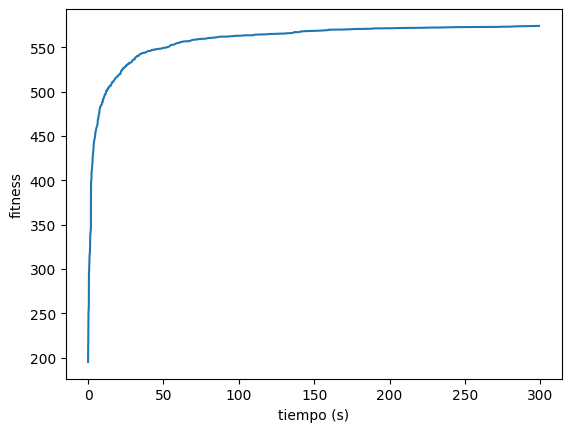

In [19]:
plt.plot(experiment1.times, experiment1.scores)
plt.xlabel('tiempo (s)')
plt.ylabel('fitness')

In [23]:
N = 1000
D = 1023
seconds = 600
mutate_random_rate = 1/940
experiment2 = run_genetic([[1 for _ in range(1000)]])

Text(0, 0.5, 'fitness')

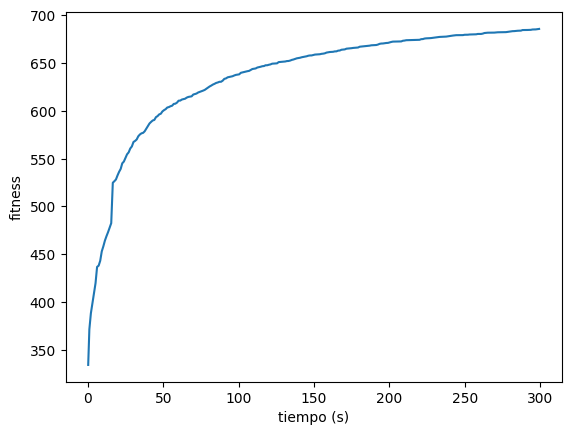

In [22]:
plt.plot(experiment2.times, experiment2.scores)
plt.xlabel('tiempo (s)')
plt.ylabel('fitness')

In [44]:
def pareto_frontier():
    global precalc
    global pareto_pokemon

    """
    Obtiene los individuos que están en la frontera de Pareto o por encima en K dimensiones para puntuajes de Pokémon.
    
    Args:
    pokemons (list of Pokemon): Lista de objetos Pokémon.
    
    Returns:
    list of Pokemon: Lista de Pokémon que están en la frontera de Pareto o por encima.
    """
    # Convertir la lista de Pokémon a una lista de puntos
    points = []
    for p in precalc[1:]:
        point = [p.vel]
        point.extend(p.atk)
        point.extend(p.spAtk)
        point.extend(p.defe)
        point.extend(p.spDef)
        points.append(point)
    
    # Inicializar la lista de puntos en la frontera de Pareto
    pareto_front = []
    
    # Iterar sobre cada punto
    for i, point in enumerate(points):
        print(i)
        # Asumir que el punto está en la frontera de Pareto
        is_pareto = True
        for j, other_point in enumerate(points):
            if i != j:
                # Si otro punto domina al punto actual, no está en la frontera de Pareto
                if all(o >= p for o, p in zip(other_point, point)) and any(o > p for o, p in zip(other_point, point)):
                    is_pareto = False
                    break
        if is_pareto:
            pareto_front.append(point)
    
    return pareto_front

pareto_front = pareto_frontier()

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [38]:
precalc

['no existe id 0',
 IndStats(atk=[49, 49, 98, 49, 98, 49, 49, 24.5, 98, 49, 49, 49, 98, 49, 49, 49, 24.5, 49], defe=[46.95742752749558, 23.47871376374779, 93.91485505499116, 93.91485505499116, 187.82971010998233, 23.47871376374779, 93.91485505499116, 46.95742752749558, 46.95742752749558, 23.47871376374779, 23.47871376374779, 46.95742752749558, 46.95742752749558, 46.95742752749558, 46.95742752749558, 46.95742752749558, 46.95742752749558, 93.91485505499116], spAtk=[46.95742752749558, 23.47871376374779, 93.91485505499116, 93.91485505499116, 187.82971010998233, 23.47871376374779, 93.91485505499116, 46.95742752749558, 46.95742752749558, 23.47871376374779, 23.47871376374779, 46.95742752749558, 46.95742752749558, 46.95742752749558, 46.95742752749558, 46.95742752749558, 46.95742752749558, 93.91485505499116], spDef=[54.08326913195984, 27.04163456597992, 108.16653826391968, 108.16653826391968, 216.33307652783935, 27.04163456597992, 108.16653826391968, 54.08326913195984, 54.08326913195984, 27.041

In [83]:
def filtrate(pareto_front):
    global pareto_dex
    global precalc

    pareto_dex = []

    for i in range(1, len(precalc)):
        pc = precalc[i]
        point = [pc.vel]
        point.extend(pc.atk)
        point.extend(pc.spAtk)
        point.extend(pc.defe)
        point.extend(pc.spDef)

        if not is_dominated(point, pareto_front):
            pareto_dex.append(i)

        

def is_dominated(point, pareto_front):
    for pareto_point in pareto_front:
        if all(p >= pt for p, pt in zip(pareto_point, point)) and any(p > pt for p, pt in zip(pareto_point, point)):
             return True
    return False


filtrate(pareto_front)

In [85]:
print(len(pareto_dex))
len(precalc)

394


1024

In [84]:
pareto_dex

[3,
 6,
 15,
 18,
 24,
 31,
 34,
 40,
 49,
 51,
 62,
 68,
 71,
 73,
 76,
 80,
 82,
 85,
 87,
 89,
 91,
 94,
 95,
 99,
 101,
 110,
 121,
 123,
 124,
 127,
 130,
 131,
 136,
 141,
 142,
 143,
 144,
 145,
 150,
 151,
 160,
 164,
 166,
 168,
 169,
 171,
 181,
 189,
 197,
 199,
 203,
 205,
 208,
 211,
 212,
 214,
 226,
 227,
 229,
 242,
 243,
 244,
 245,
 247,
 248,
 249,
 250,
 251,
 254,
 257,
 260,
 269,
 272,
 277,
 284,
 286,
 289,
 291,
 292,
 306,
 308,
 313,
 317,
 319,
 323,
 324,
 336,
 338,
 342,
 344,
 346,
 348,
 354,
 357,
 359,
 362,
 365,
 369,
 373,
 377,
 378,
 379,
 380,
 381,
 382,
 383,
 384,
 385,
 386,
 389,
 392,
 395,
 398,
 400,
 405,
 407,
 409,
 411,
 413,
 416,
 419,
 423,
 426,
 435,
 442,
 445,
 448,
 452,
 454,
 460,
 461,
 462,
 464,
 465,
 466,
 468,
 469,
 470,
 472,
 473,
 475,
 476,
 478,
 479,
 482,
 483,
 484,
 485,
 486,
 487,
 488,
 490,
 491,
 492,
 493,
 494,
 497,
 500,
 516,
 521,
 526,
 528,
 530,
 534,
 537,
 539,
 542,
 545,
 547,
 553,
 555,


In [88]:
def mutate_pareto(population:list[list[int]]):
    global mutation_rate   #  ratio de que un gen mute

    global best_team
    
    for team in population:
        if id(team) != id(best_team):
            for i in range(N):                
                if mutation_rate >= random.uniform(0, 1.0):
                    team[i] = random.choice(pareto_dex)


In [91]:
N = 100
D = 1023
seconds = 300

mutate = mutate_pareto
mutate_random_rate = 1/95
experiment100pareto = run_genetic([[1 for _ in range(100)]])

Text(0, 0.5, 'fitness')

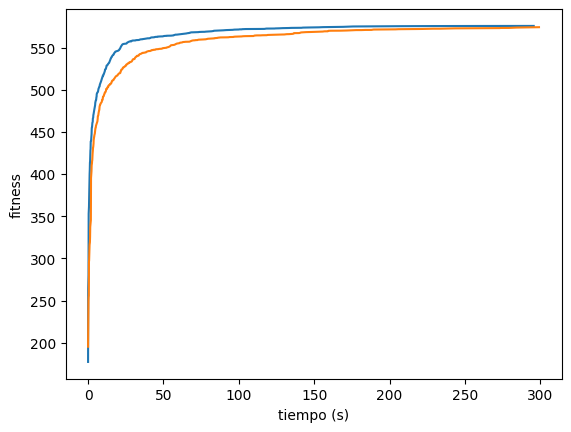

In [97]:
plt.plot(experiment100pareto.times, experiment100pareto.scores)
plt.plot(experiment1.times, experiment1.scores)
plt.xlabel('tiempo (s)')
plt.ylabel('fitness')

In [99]:
N=1000
seconds = 60 * 10
experiment100pareto = run_genetic([[1 for _ in range(1000)]])

Text(0, 0.5, 'fitness')

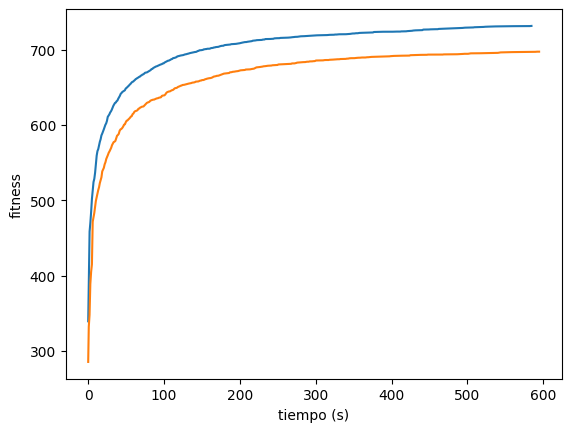

In [100]:
plt.plot(experiment100pareto.times, experiment100pareto.scores)
plt.plot(experiment2.times, experiment2.scores)
plt.xlabel('tiempo (s)')
plt.ylabel('fitness')

In [101]:
experiment2.scores[-1]

697.4432093216991

In [103]:
experiment100pareto.scores[-1]

731.645324499486

teamScore = 731.645324499486


#ID,Imagen,Nombre,Tipo,Estadísticas,Atacando frente a tipos,Defendiendo frente a tipos
#530,,Excadrill,"['ground', 'steel']",,"x2: ['fire', 'electric', 'poison', 'rock', 'steel', 'ice', 'rock', 'fairy']x0.5: ['grass', 'flying', 'bug', 'water']","/4: ['poison', 'rock']/2: ['normal', 'electric', 'flying', 'psychic', 'bug', 'ghost', 'dragon', 'dark', 'steel', 'fairy']/0.5: ['fire', 'water', 'fighting', 'ground'] /0.25: []"
#815,,Cinderace,['fire'],,"x2: ['grass', 'ice', 'bug', 'steel']x0.5: ['fire', 'water', 'rock', 'dragon']","/4: []/2: ['fire', 'grass', 'ice', 'bug', 'steel', 'fairy']/0.5: ['water', 'ground', 'rock'] /0.25: []"
#487,,Giratina-altered,"['ghost', 'dragon']",,"x2: ['psychic', 'ghost', 'dragon']x0.5: ['normal', 'dark', 'steel', 'steel', 'fairy']","/4: []/2: ['normal', 'fire', 'water', 'electric', 'grass', 'fighting', 'poison', 'bug']/0.5: ['ice', 'ghost', 'dragon', 'dark', 'fairy'] /0.25: []"
#618,,Stunfisk,"['ground', 'electric']",,"x2: ['fire', 'electric', 'poison', 'rock', 'steel', 'water', 'flying']x0.5: ['grass', 'bug', 'grass', 'ground', 'dragon']","/4: ['electric']/2: ['poison', 'flying', 'rock', 'steel']/0.5: ['water', 'grass', 'ice', 'ground'] /0.25: []"
#249,,Lugia,"['psychic', 'flying']",,"x2: ['fighting', 'poison', 'grass', 'fighting', 'bug']x0.5: ['psychic', 'dark', 'steel', 'electric', 'rock', 'steel']","/4: ['fighting']/2: ['grass', 'ground', 'psychic']/0.5: ['electric', 'ice', 'rock', 'ghost', 'dark'] /0.25: []"
#250,,Ho-oh,"['fire', 'flying']",,"x2: ['grass', 'ice', 'bug', 'steel', 'grass', 'fighting', 'bug']x0.5: ['fire', 'water', 'rock', 'dragon', 'electric', 'rock']","/4: ['grass', 'bug']/2: ['fire', 'fighting', 'steel', 'fairy']/0.5: ['water', 'electric'] /0.25: ['rock']"
#565,,Carracosta,"['water', 'rock']",,"x2: ['fire', 'ground', 'rock', 'fire', 'ice', 'flying', 'bug']x0.5: ['water', 'grass', 'dragon', 'fighting', 'steel']","/4: ['fire']/2: ['normal', 'ice', 'poison', 'flying']/0.5: ['electric', 'fighting', 'ground'] /0.25: ['grass']"
#894,,Regieleki,['electric'],,"x2: ['water', 'flying']x0.5: ['electric', 'grass', 'ground', 'dragon']","/4: []/2: ['electric', 'flying', 'steel']/0.5: ['ground'] /0.25: []"
#860,,Morgrem,"['dark', 'fairy']",,"x2: ['psychic', 'ghost', 'fighting', 'dragon', 'dark']x0.5: ['steel', 'fairy', 'fire', 'poison', 'steel']","/4: ['dark']/2: ['psychic', 'ghost', 'dragon']/0.5: ['steel', 'fairy'] /0.25: []"
#1009,,Walking-wake,"['water', 'dragon']",,"x2: ['fire', 'ground', 'rock', 'dragon']x0.5: ['water', 'grass', 'steel', 'fairy']","/4: ['fire', 'water']/2: ['steel']/0.5: ['dragon', 'fairy'] /0.25: []"

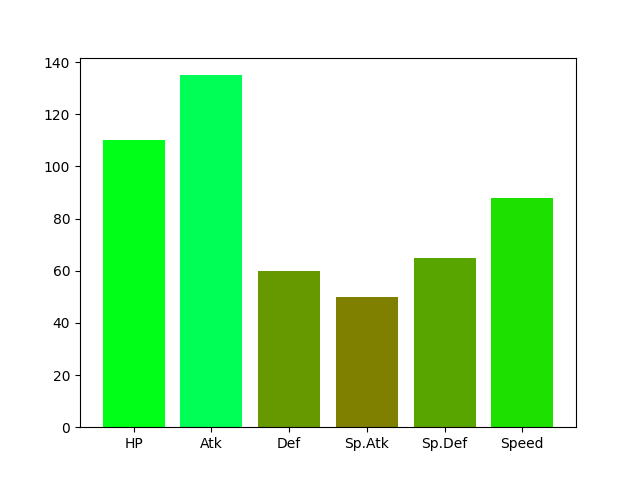
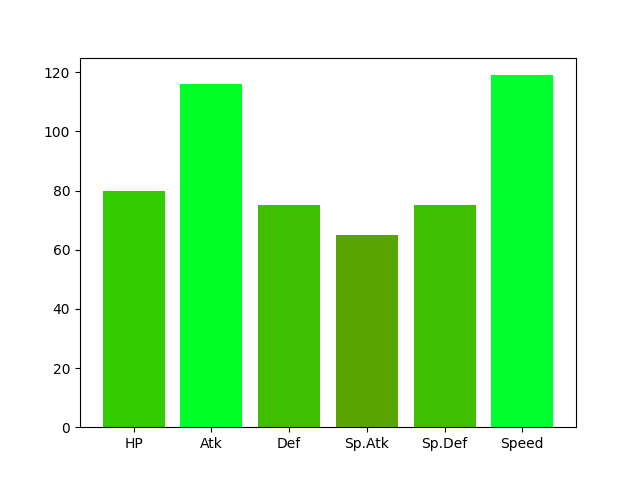
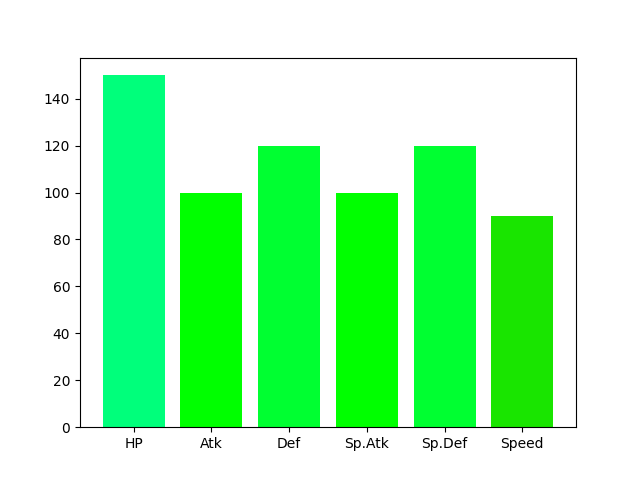
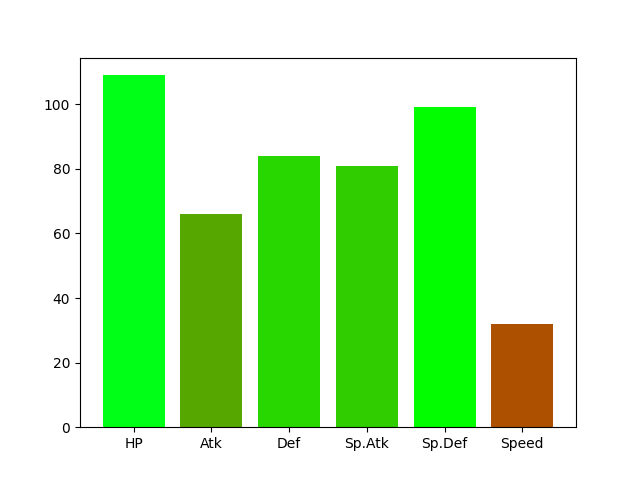
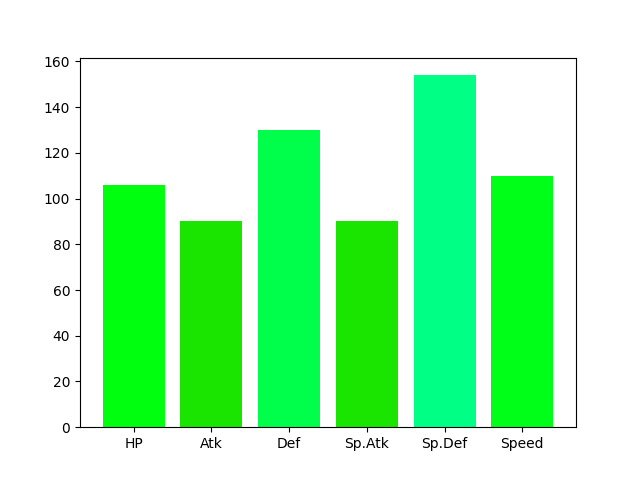
...
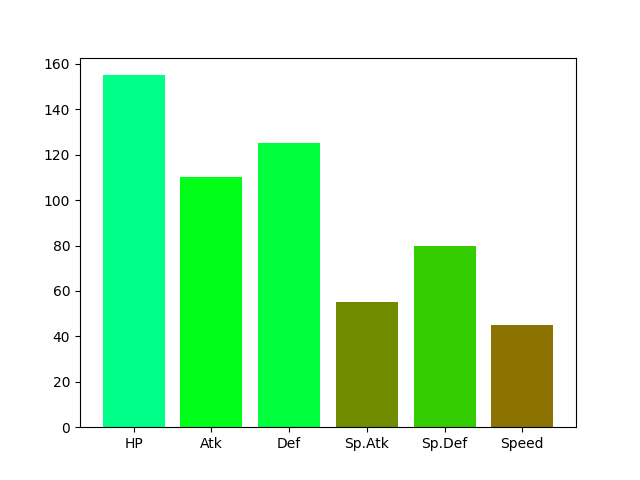
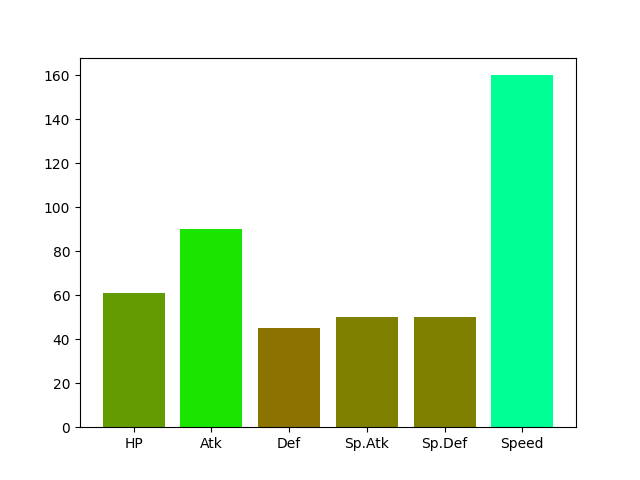
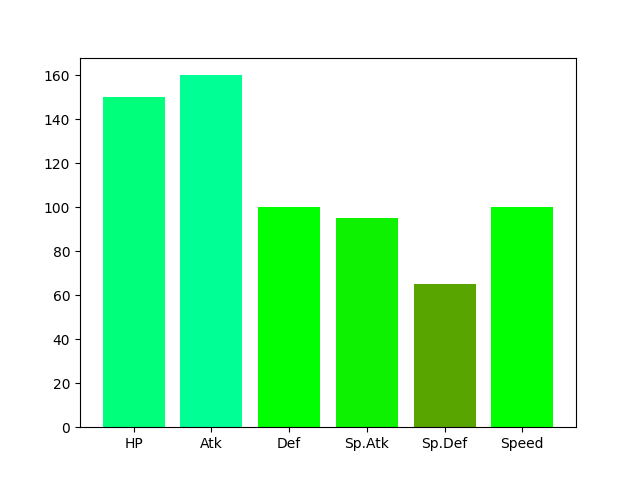
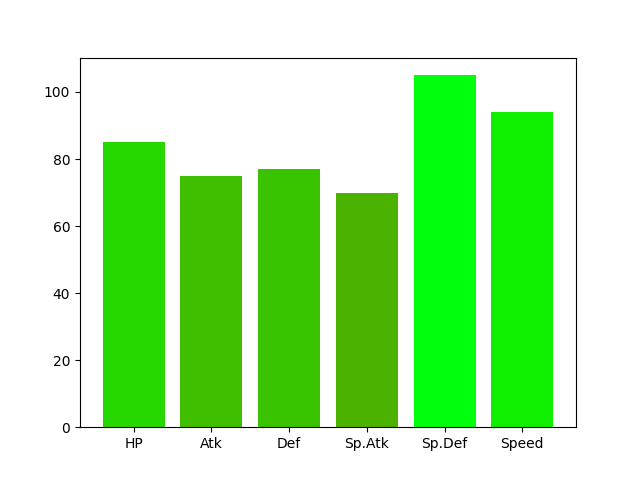
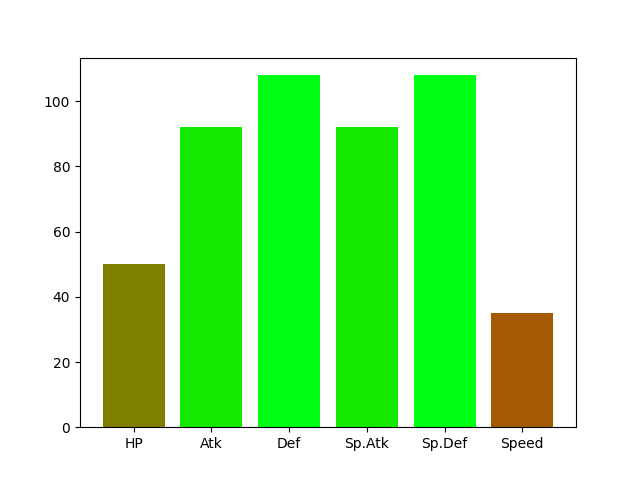

In [104]:
showTeam(best_team)